## Обучение моделей

Для обучения используем модели XGBoost, CatBoost и LinearRegression. Произведем обучение на тренировочной и тестовой выборках а также подберём параметры наилучшей модели.

In [ ]:
def model(model, model_params):
    gscv = GridSearchCV(estimator=model, param_grid=model_params, cv=5, verbose=0)
    gscv.fit(features_train, target_train)
    train_predictions = gscv.predict(features_train)
    predictions = gscv.predict(features_test)
    mae_train = mean_absolute_error(target_train, train_predictions)
    mae_test = mean_absolute_error(target_test, predictions)
    best_params = gscv.best_params_
    return mae_train, mae_test, best_params

**Модель XGBoost**

In [ ]:
%%time
xgbm_params = {
          'n_estimators': np.arange(300, 700, 100),
          'learning_rate': np.arange(0.03, 0.12, 0.02),
          'random_state':[45]}
mae_train_xgbm, mae_test_xgbm, best_params_xgbm = model(xgb.XGBRegressor(), xgbm_params)

[09:42:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[09:42:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[09:42:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[09:42:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[09:42:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[09:42:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[09:42:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[09:42:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

In [ ]:
mae_train_xgbm, mae_test_xgbm

(4.832024695416246, 6.062007939992009)

**Модель CatBoost**

In [ ]:
%%time
cb_params = {'loss_function':['MAE'],
          'n_estimators': np.arange(300, 700, 100),
          'learning_rate': np.arange(0.03, 0.12, 0.02),
          'random_state':[45],
          'depth': np.arange(3, 7)}


mae_train_cb, mae_test_cb, best_params_cb = model(CatBoostRegressor(), cb_params)

0:	learn: 9.8929376	total: 49.5ms	remaining: 14.8s
1:	learn: 9.8407946	total: 50.2ms	remaining: 7.48s
2:	learn: 9.7969491	total: 51.7ms	remaining: 5.12s
3:	learn: 9.7581716	total: 52.7ms	remaining: 3.9s
4:	learn: 9.7074537	total: 53.5ms	remaining: 3.16s
5:	learn: 9.6567151	total: 54.2ms	remaining: 2.65s
6:	learn: 9.6154945	total: 55.3ms	remaining: 2.31s
7:	learn: 9.5794307	total: 56.1ms	remaining: 2.05s
8:	learn: 9.5503190	total: 58.2ms	remaining: 1.88s
9:	learn: 9.5092471	total: 60ms	remaining: 1.74s
10:	learn: 9.4594450	total: 60.9ms	remaining: 1.6s
11:	learn: 9.4298976	total: 62.4ms	remaining: 1.5s
12:	learn: 9.3988560	total: 63ms	remaining: 1.39s
13:	learn: 9.3619825	total: 63.8ms	remaining: 1.3s
14:	learn: 9.3117038	total: 137ms	remaining: 2.6s
15:	learn: 9.2800479	total: 139ms	remaining: 2.46s
16:	learn: 9.2521083	total: 140ms	remaining: 2.33s
17:	learn: 9.2200712	total: 141ms	remaining: 2.21s
18:	learn: 9.2025396	total: 142ms	remaining: 2.1s
19:	learn: 9.1682505	total: 143ms	rem

In [ ]:
mae_train_cb, mae_test_cb

(4.304773546037934, 6.257901305306101)

**Модель LinearRegression**

In [ ]:
%%time
lr_params = {'fit_intercept' : [True, False],
 'normalize':[True,False]}

mae_train_lr, mae_test_lr, best_params_lr = model(LinearRegression(), lr_params)

CPU times: user 282 ms, sys: 331 ms, total: 613 ms
Wall time: 586 ms


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


In [ ]:
mae_train_lr, mae_test_lr

(8.107628951886209, 8.021713595511603)

Сведём результаты моделей в таблице

In [ ]:
d = ({'MAE train':[mae_train_xgbm, mae_train_cb, mae_train_lr]
      ,'MAE test':[mae_test_xgbm, mae_test_cb,mae_test_lr]
     ,'Время предсказания':['56.4 c.','4 мин. 52 с.','158 мс.']})
data = pd.DataFrame(data=d, index=['XGBoost','CatBoost','LinearRegression'])
data

,MAE train,MAE test,Время предсказания
XGBoost,4.832025,6.062008,1 мин. 38 c.
CatBoost,4.304774,6.257901,4 мин. 52 с.
LinearRegression,8.107629,8.021714,158 мс.


Лучшей моделью оказалось XGBoost.

**Модель XGBoost на тествой выборке с лучшими параметрами**

In [ ]:
model_xgb = xgb.XGBRegressor(random_state = 45
                             ,n_estimators = 300
                             ,learning_rate = 0.03)
model_xgb.fit(features_train, target_train)
predictions = model_xgb.predict(features_test)
mae = mean_absolute_error(target_test, predictions)
mae

[10:25:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


6.173917500841184

**Важность призноков модели XGBoost**

In [ ]:
fi_xgb = pd.DataFrame({'Признаки':features_test.columns,'Важность':model_xgb.feature_importances_})
fi_xgb = fi_xgb.sort_values('Важность',ascending=False)

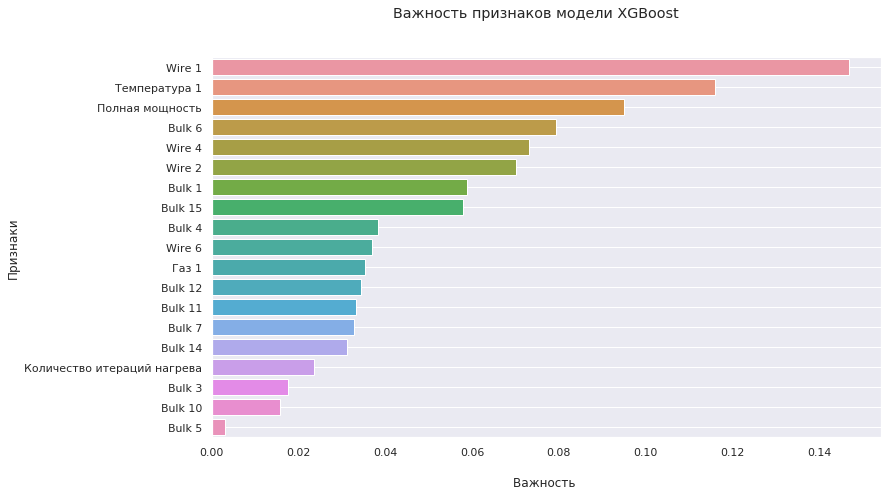

In [ ]:
plt.figure(figsize=(12,7))
sns.barplot(x='Важность', y =  'Признаки',data = fi_xgb)
plt.suptitle( 'Важность признаков модели XGBoost'+ "\n")
plt.ylabel('Признаки')
plt.xlabel("\n" + 'Важность ')
plt.grid()
plt.show()

**Вывод:**

В данном пункте обучили 3 модели: XGBoost, CatBoost, LinearRegression. Лучшей моделью является XGBoost, для которой удалось достичь MAE на тестовой выборке 6.06, при этом модель имеет среднее время обучения (1 мин. 38 c.). Средней по качеству является модель CatBoost (тестовое MAE = 6.27), но модель обучалось дольше остальных (4 мин. 52 с.). Худшей по качеству моделью является LinearRegression (тестовое MAE = 8.02), при этом модель обучалось быстрее остальных (158 мс.).

## Общий вывод



В ходе выполнения проекта об оптимизации производственных расходов в промышленности были выполнены следующие шаги:

1) Загружены и проанализированы данные

Вывялены аномальные значения, пропуски, столбцы и таблицы ненужные для построения модели.

2) Подготовлены данные

Удалены аномалии и пустые значения, посчитана полная мощность и количество итерация нагрева, соединены таблицы, выделены признаки и целевой признак, выборка разделена в соотношении 70 на 30, произведена стандартизация данных.

3) Обучены модели LinearRegression, CatBoost, XGBM

Лучшей моделью является XGBoost, для которой удалось достичь MAE на тестовой выборке 6.06, при этом модель имеет среднее время обучения (1 мин. 38 c.). Средней по качеству является модель CatBoost (тестовое MAE = 6.27), но модель обучалось дольше остальных (4 мин. 52 с.). Худшей по качеству моделью является LinearRegression (тестовое MAE = 8.02), при этом модель обучалось быстрее остальных (158 мс.).